# An introduction to image processing

In [1]:
import numpy as np
import matplotlib.pyplot as plt

Utility functions to make filters and interpolation

In [2]:
def upsample_matrix(m, pow):
  # Multiply the image space
  result = []
  for row in m :
    l = []
    for element in row[:-1] :
      l.append(element)
      # Add extra columns
      for i in range(pow - 1):
        l.append(-1)
    l.append(row[-1])
    result.append(l)
    # Add extra rows
    for i in range(pow - 1):
        result.append([-1 for j in range(len(m[0]) * pow - (pow - 1))])
  # Delete extra rows
  return result[:-pow + 1]

def interpolate(m, i, j, pow):
  if i % pow == 0:
    j_0 = (j // pow) * pow
    j_1 = (j // pow + 1) * pow
    j_val = (j % pow) / pow
    return int(m[i][j_0] + j_val * (m[i][j_1] - m[i][j_0]))
  elif j % pow == 0:
    i_0 = (i // pow) * pow
    i_1 = (i // pow + 1) * pow
    i_val = (i % pow) / pow
    return int(m[i_0][j] + i_val * (m[i_1][j] - m[i_0][j]))
  else:
    i_0 = (i // pow) * pow
    i_1 = (i // pow + 1) * pow
    i_val = (i % pow) / pow
    j_0 = (j // pow) * pow
    j_1 = (j // pow + 1) * pow
    j_val = (j % pow) / pow
    return int((m[i_1][j_0] - m[i_0][j_0]) * i_val + (m[i_0][j_1] - m[i_0][j_0]) * j_val + (m[i_1][j_1] + m[i_0][j_0] - m[i_0][j_1] - m[i_1][j_0]) * i_val * j_val + m[i_0][j_0])

def convolve(m, i, j, mask):
  if i >= len(m) - len(mask)//2 or j >= len(m[0]) - len(mask)//2 or i - len(mask)//2  < 0 or j - len(mask)//2 < 0:
    return m[i][j]
  else:
    denom = 0
    for row in mask:
      for element in row:
        denom += element
    if denom == 0 : denom = 1 
    num = 0
    for x in range(len(mask)):
      for y in range(len(mask)):
        num += mask[x][y] * m[x + i - 1][y + j - 1]
    return num / denom

def laplacian_mask(nh=4, sign=1):
  assert sign == 1 or sign == -1
  if nh == 4:
    return np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]]) * sign
  else:
    return np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]) * sign

def laplacian_enhancement_mask(nh=4):
  if nh == 4:
    return np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
  else:
    return np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

The class PGMImage let us read and process an image

In [3]:
class PGMImage:
  def __init__(self, uri):
    self.uri = uri
    self.read()
  
  def read(self):
    with open(self.uri) as f:
      lines = f.readlines()

    for l in lines:
      if l[0] == '#' : lines.remove(l)

    assert lines[0].strip() == 'P2' 

    data = []
    for line in lines[1:]:
      for e in line.split():
        data.append(int(e))

    self.original_shape = (data[1], data[0]) # Height, Width
    self.shape = (data[1], data[0]) # Height, Width
    self.max_intensity = data[2]
    self.original_data = np.array(data[3:])
    self.pixels = np.reshape(self.original_data, self.shape)

  def reset(self, uri=None):
    if uri == None : uri = self.uri
    self.uri = uri
    self.read()

  def display_original(self, factor=10):
    plt.figure(figsize = (factor, factor))
    plt.imshow(np.reshape(self.original_data, self.original_shape), cmap='gray', vmin=0, vmax=self.max_intensity, interpolation='none', aspect='equal')

  def display(self, factor=10):
    plt.figure(figsize = (factor, factor))
    plt.imshow(self.pixels, cmap='gray', vmin=0, vmax=self.max_intensity, interpolation='none', aspect='equal')

  def up_sample(self, factor):
    assert isinstance(factor, int)
    assert factor > 0

    pow = 1 << factor

    upsampled = upsample_matrix(self.pixels, pow)

    # Shape recalculation
    self.shape = tuple(i for i in map(lambda e : e * pow - (pow - 1), self.shape))

    # Replace -1's using interpolation
    for i in range(self.shape[0]):
      for j in range(self.shape[1]):
        if upsampled[i][j] == -1:
          upsampled[i][j] = interpolate(upsampled, i, j, pow)

    self.pixels = np.array(upsampled)

  def apply_filter(self, mask):
    filtered = np.copy(self.pixels)
    for i in range(self.shape[0]):
      for j in range(self.shape[1]):
        filtered[i][j] = convolve(self.pixels, i, j, mask)
    self.pixels = filtered

# Pixel interpolation

Read and display an image

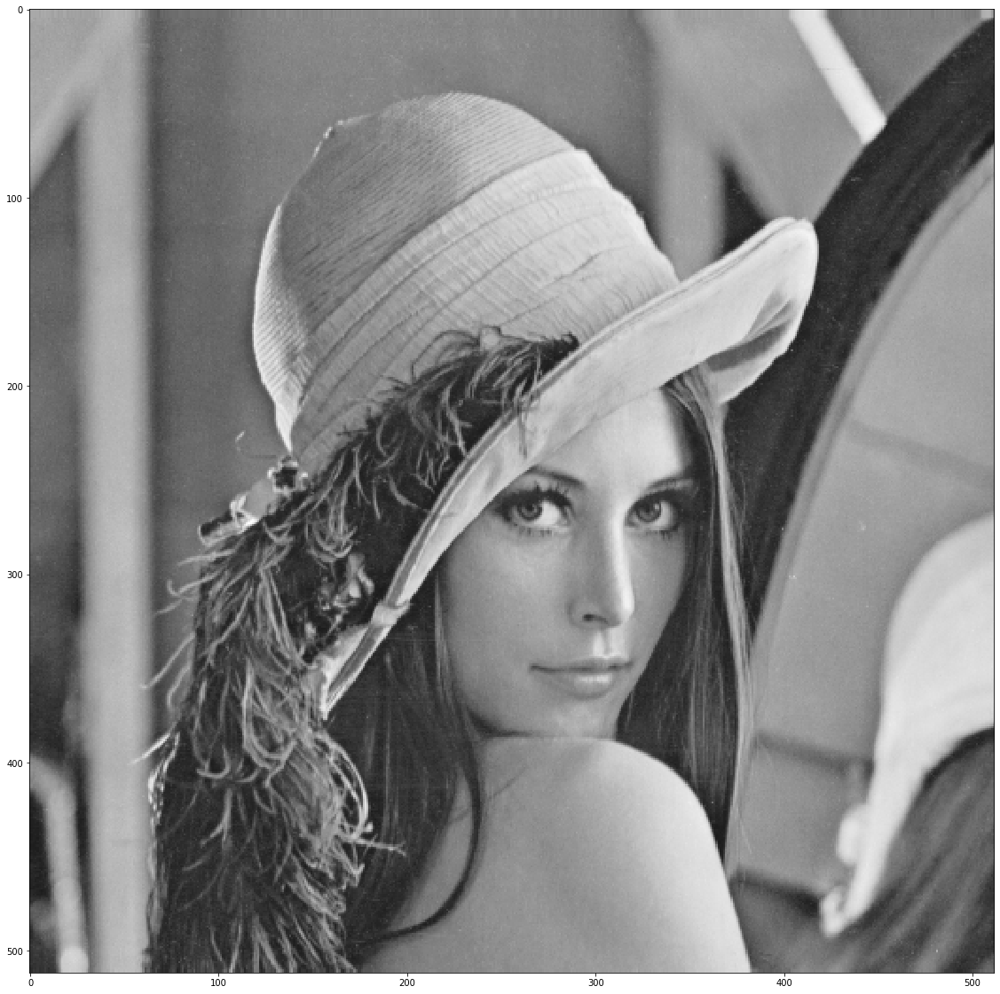

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.display(20)

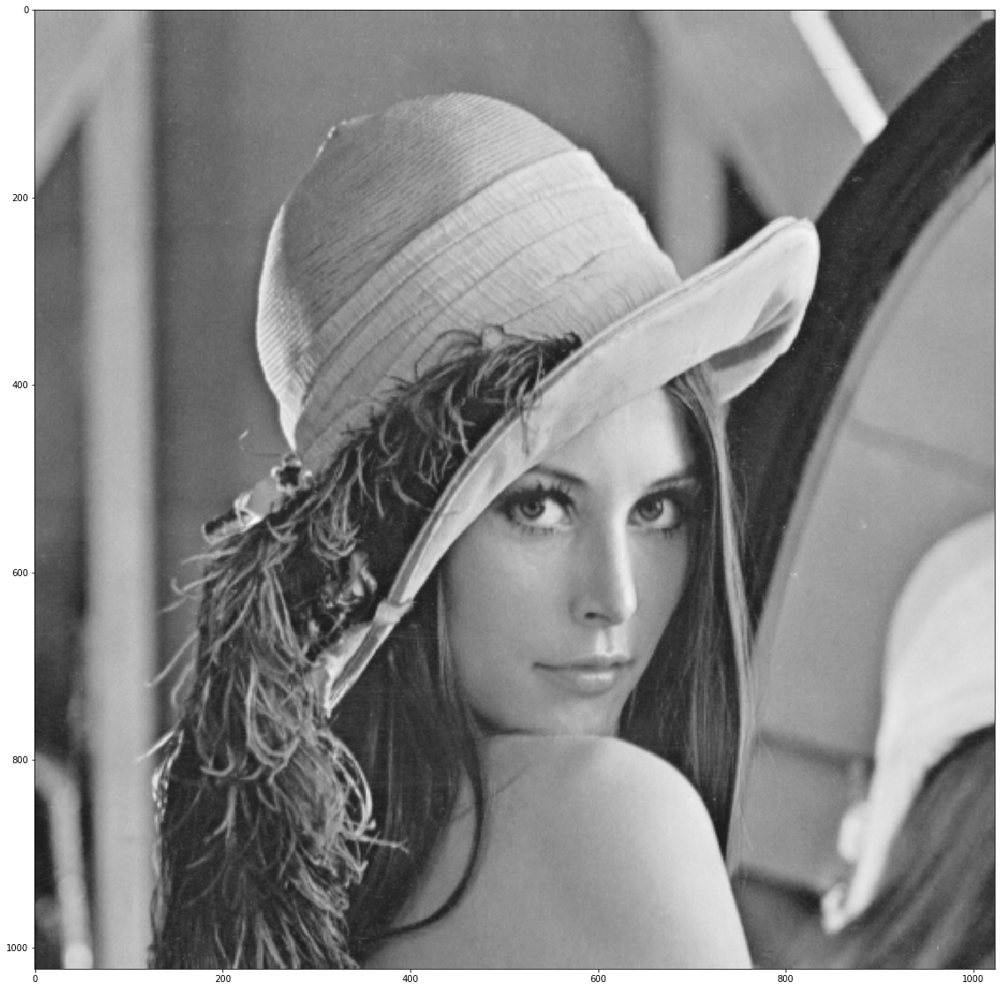

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.up_sample(1)
i.display(20)

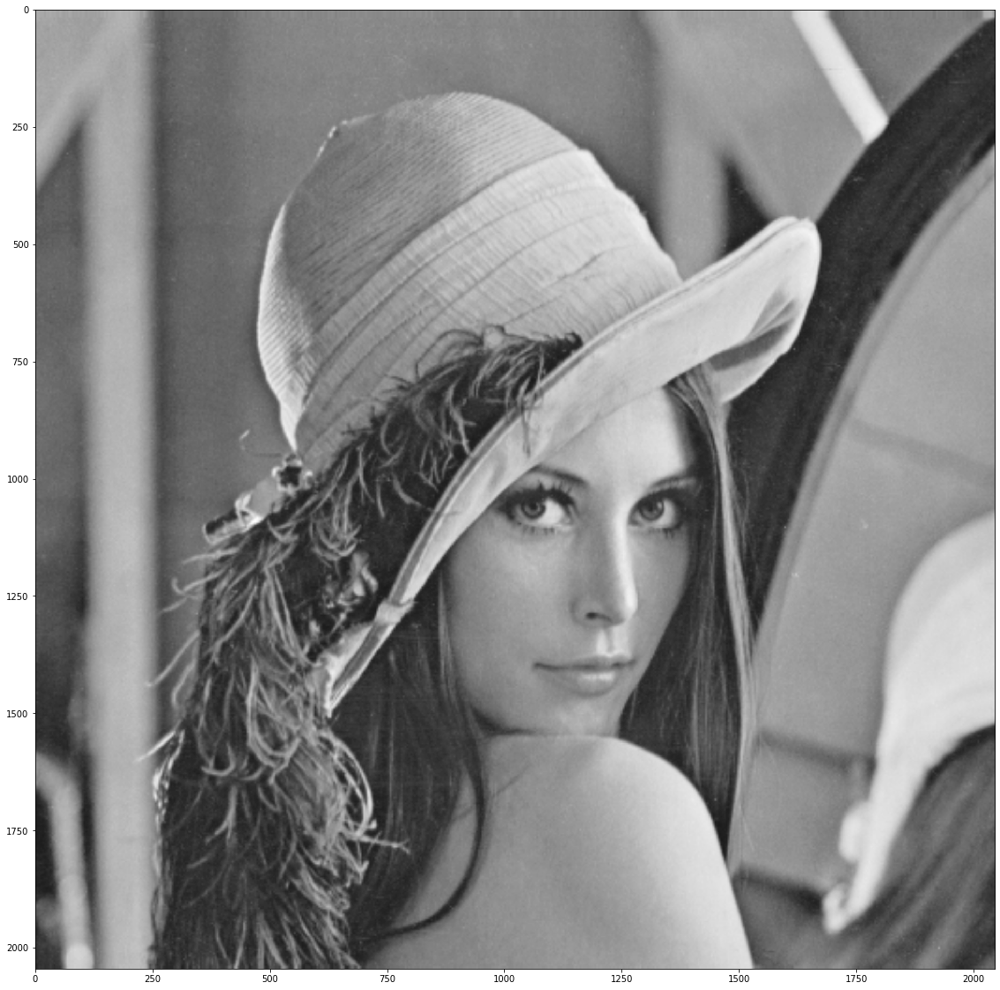

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.up_sample(2)
i.display(20)

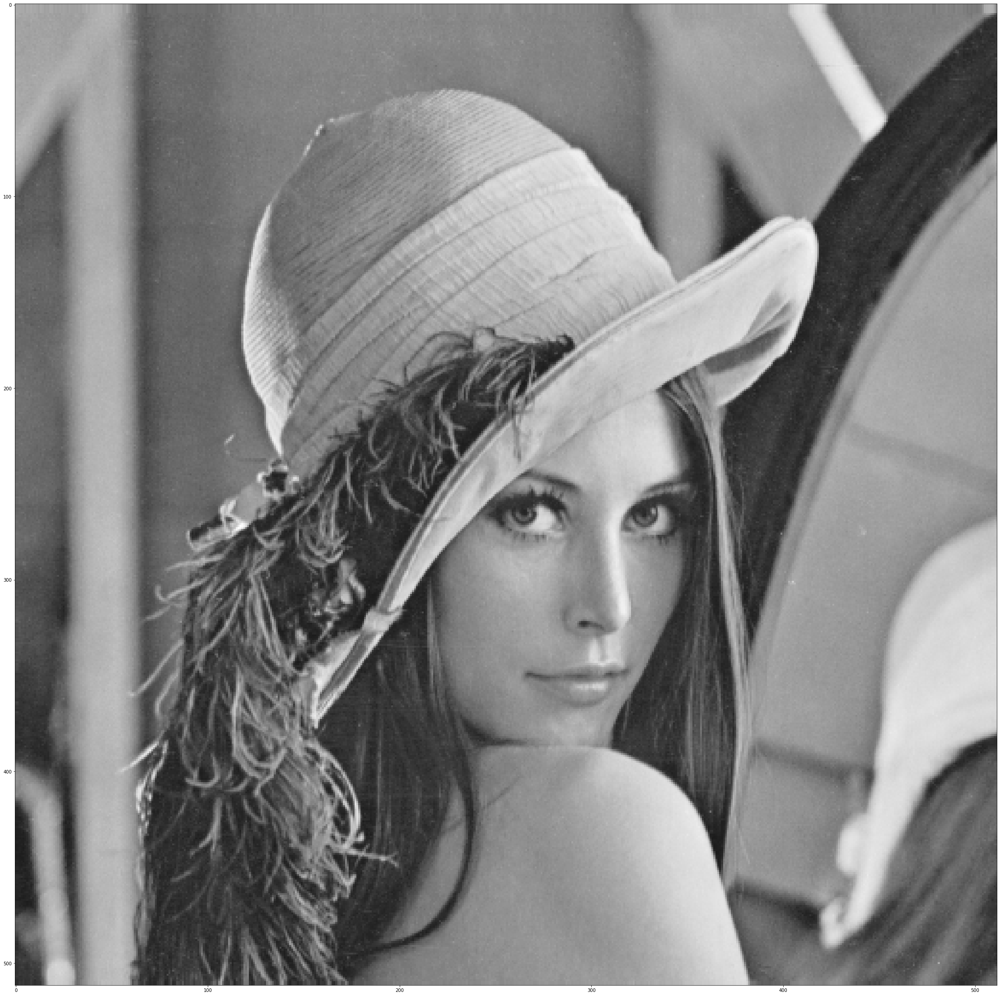

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.display(40)

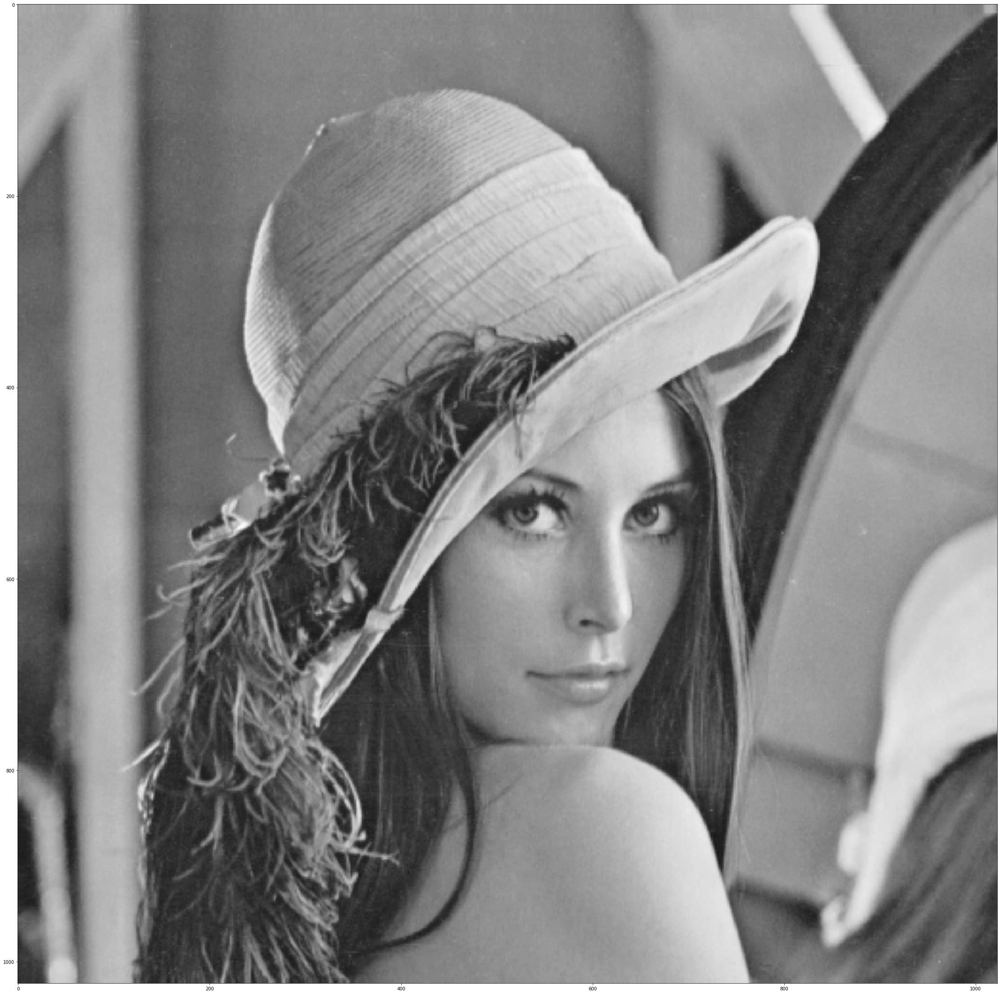

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.up_sample(1)
i.display(40)

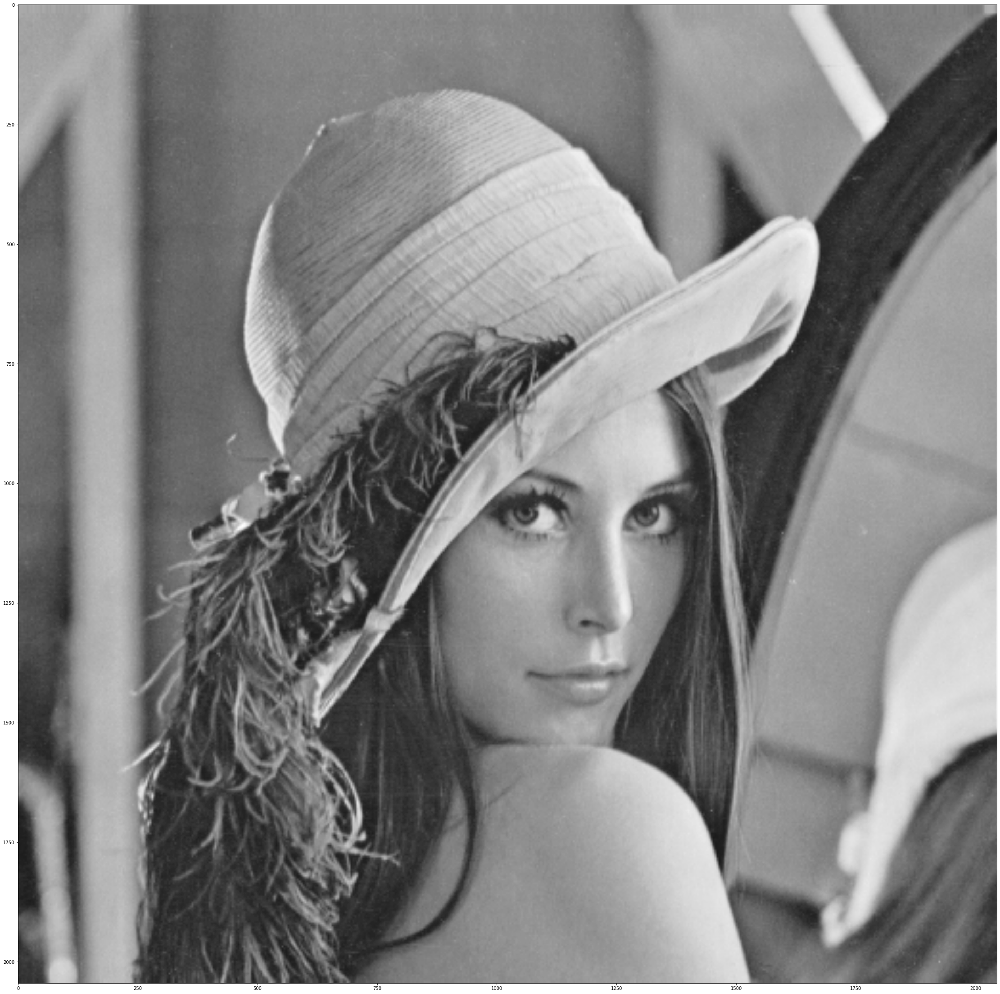

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.up_sample(2)
i.display(40)

# Laplacian filtering

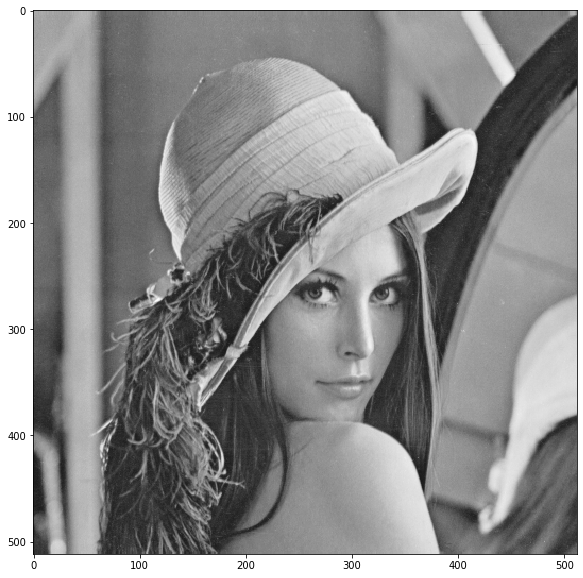

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.display()

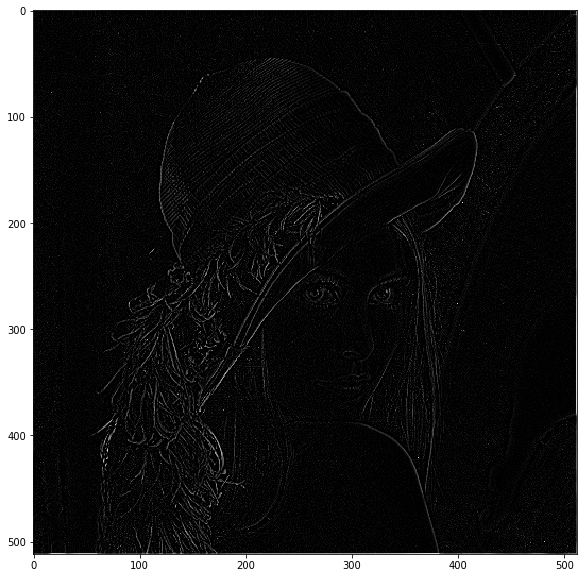

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.apply_filter(laplacian_mask(sign=1))
i.display()

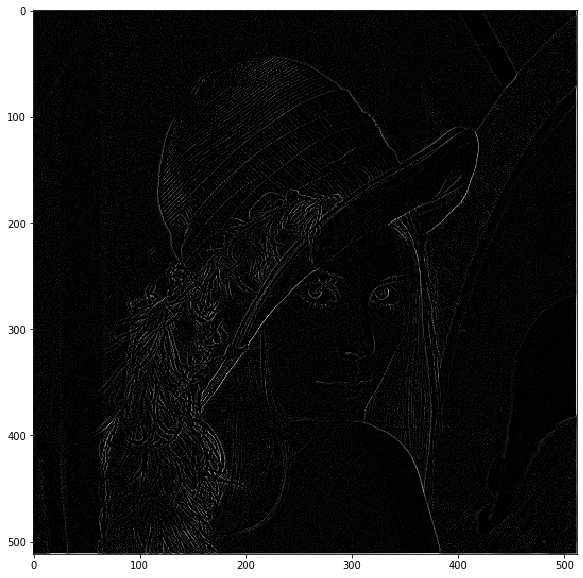

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.apply_filter(laplacian_mask(sign=-1))
i.display()

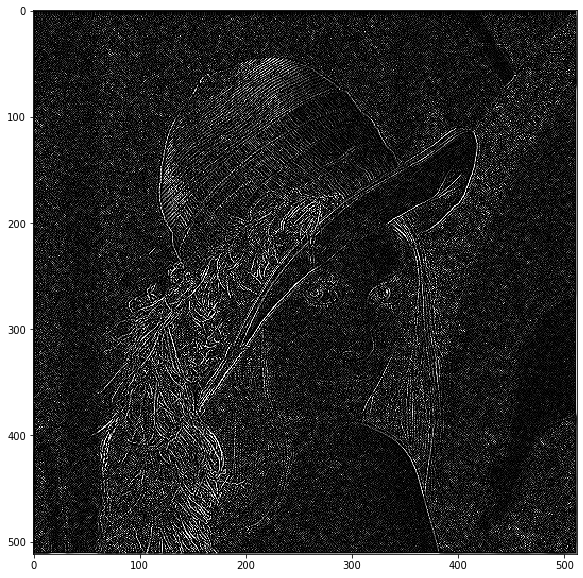

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
for j in range(2):
  i.apply_filter(laplacian_mask())
i.display()

# Enhancement using laplacian filtering

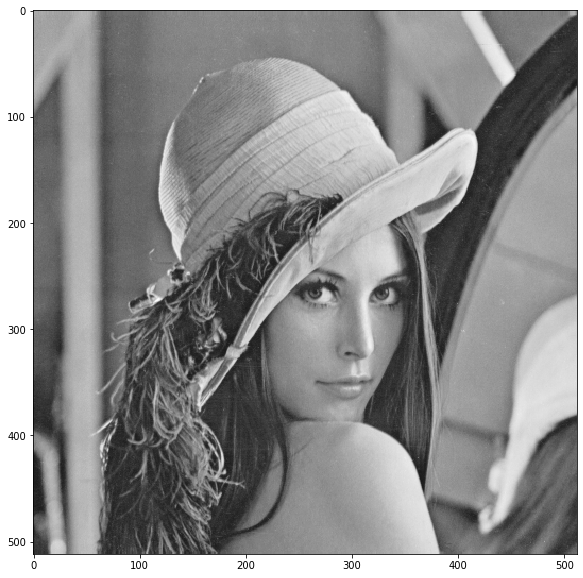

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.display()

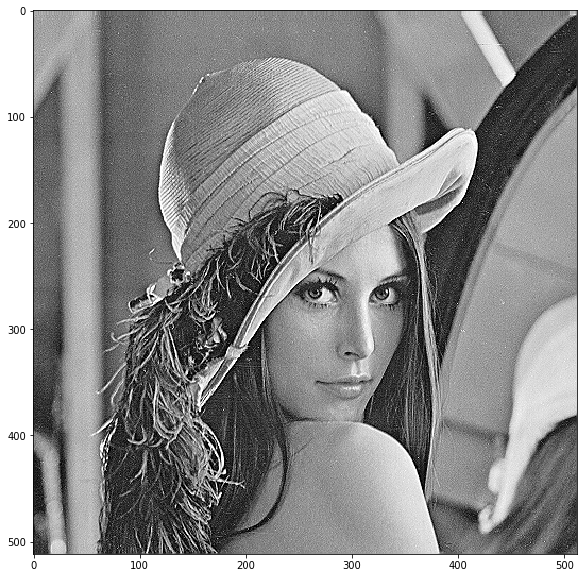

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.apply_filter(laplacian_enhancement_mask())
i.display()

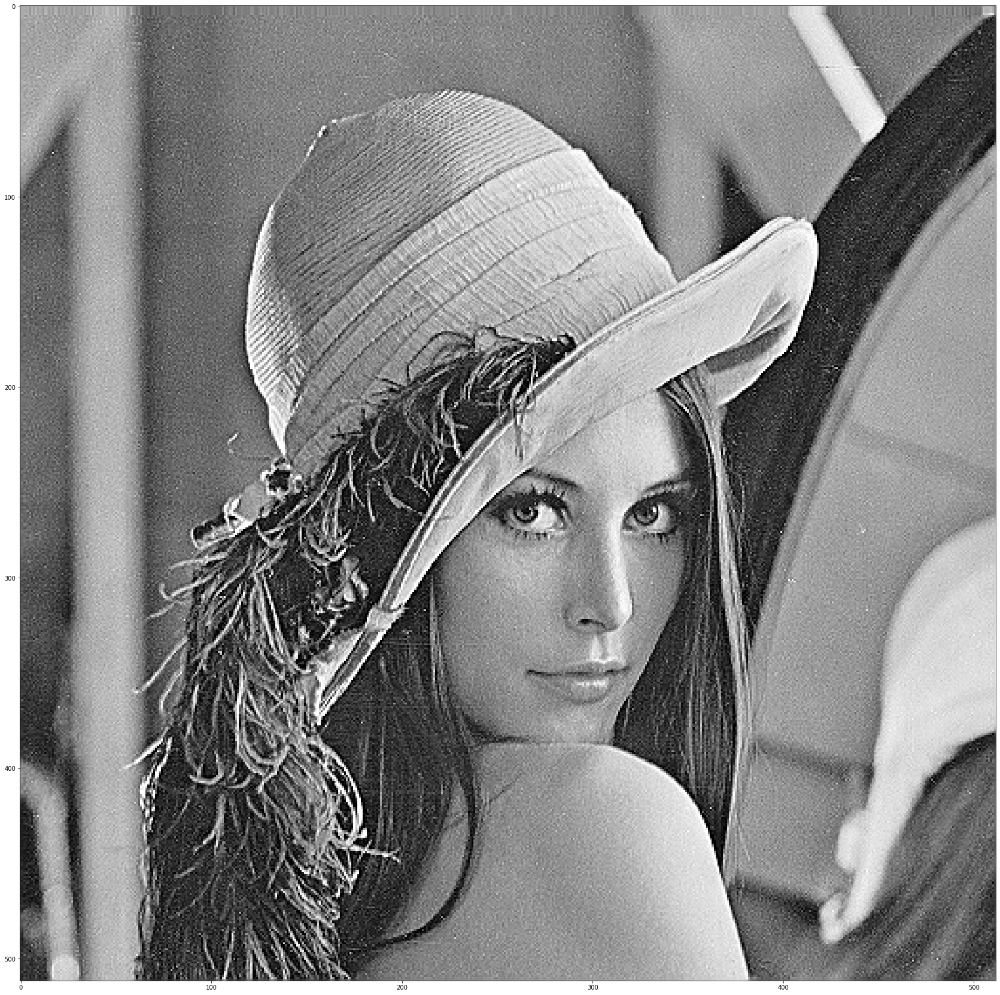

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.apply_filter(laplacian_enhancement_mask())
i.display(30)

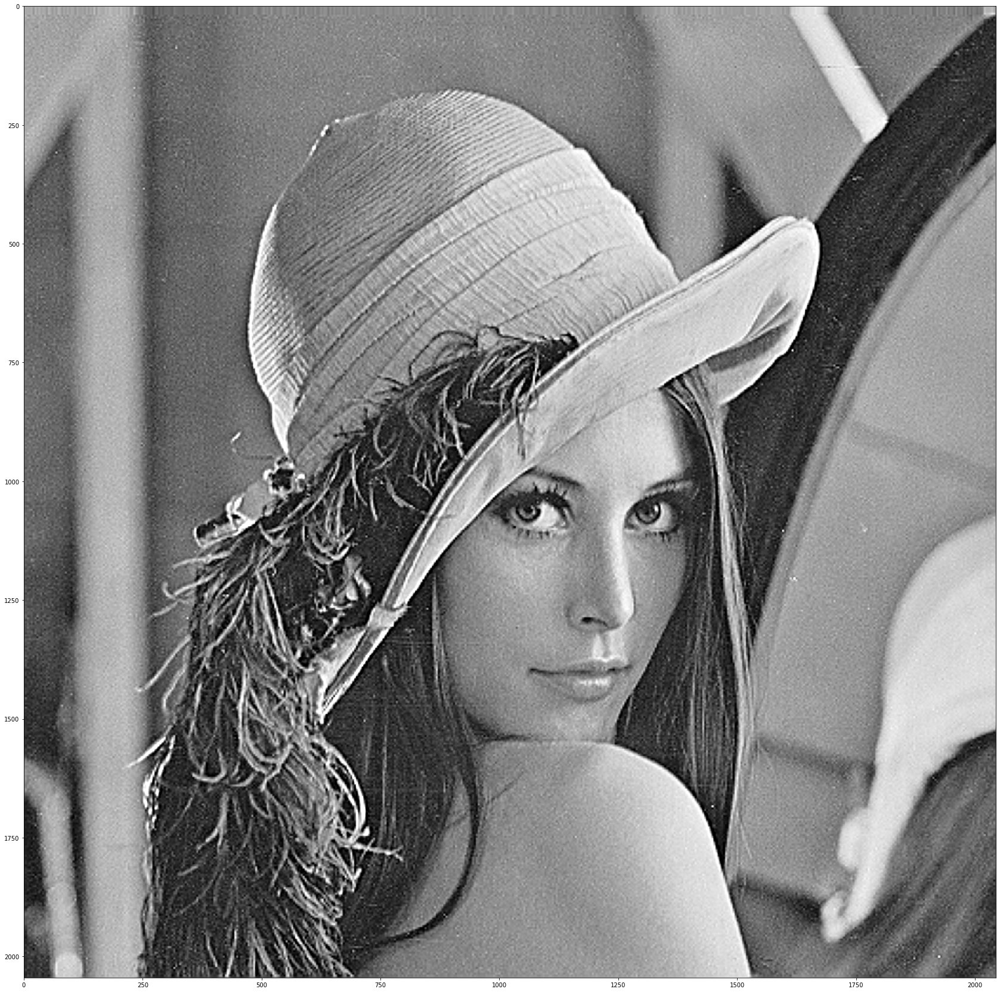

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.apply_filter(laplacian_enhancement_mask())
i.up_sample(2)
i.display(30)

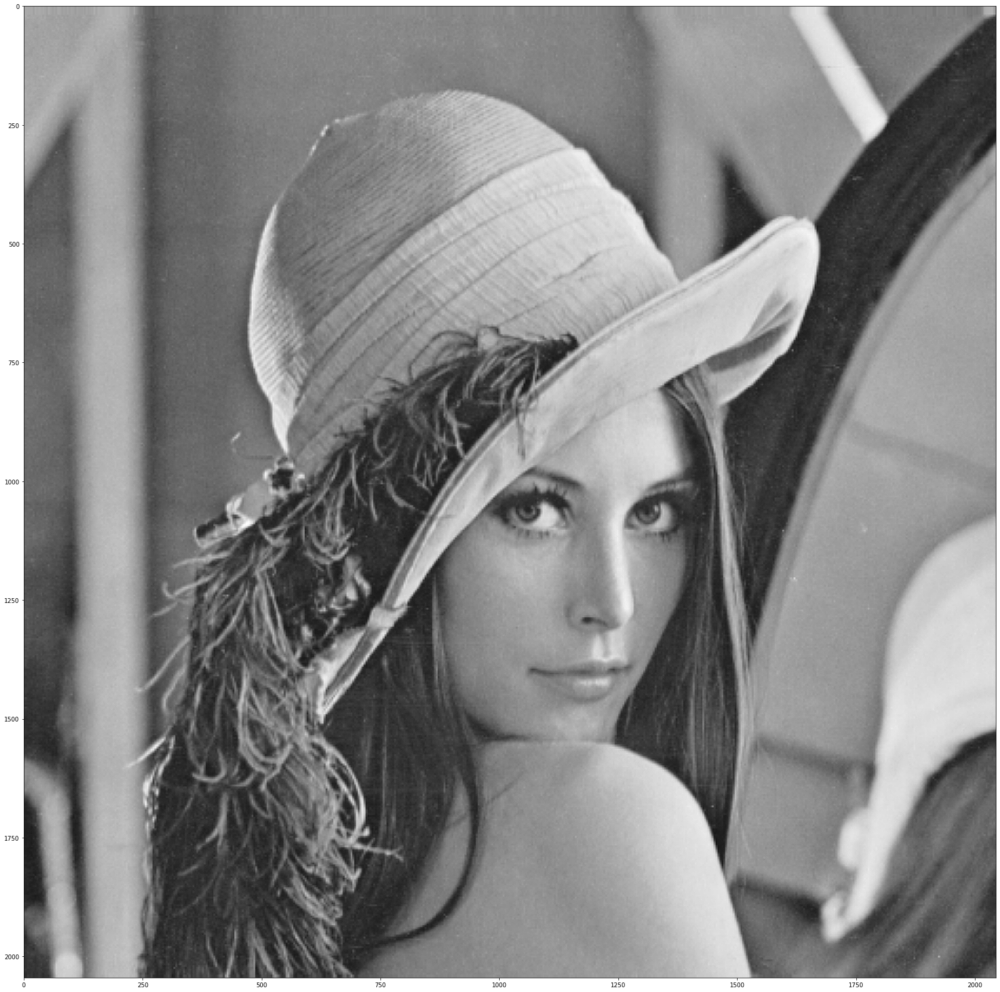

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.up_sample(2)
i.apply_filter(laplacian_enhancement_mask())
i.display(30)

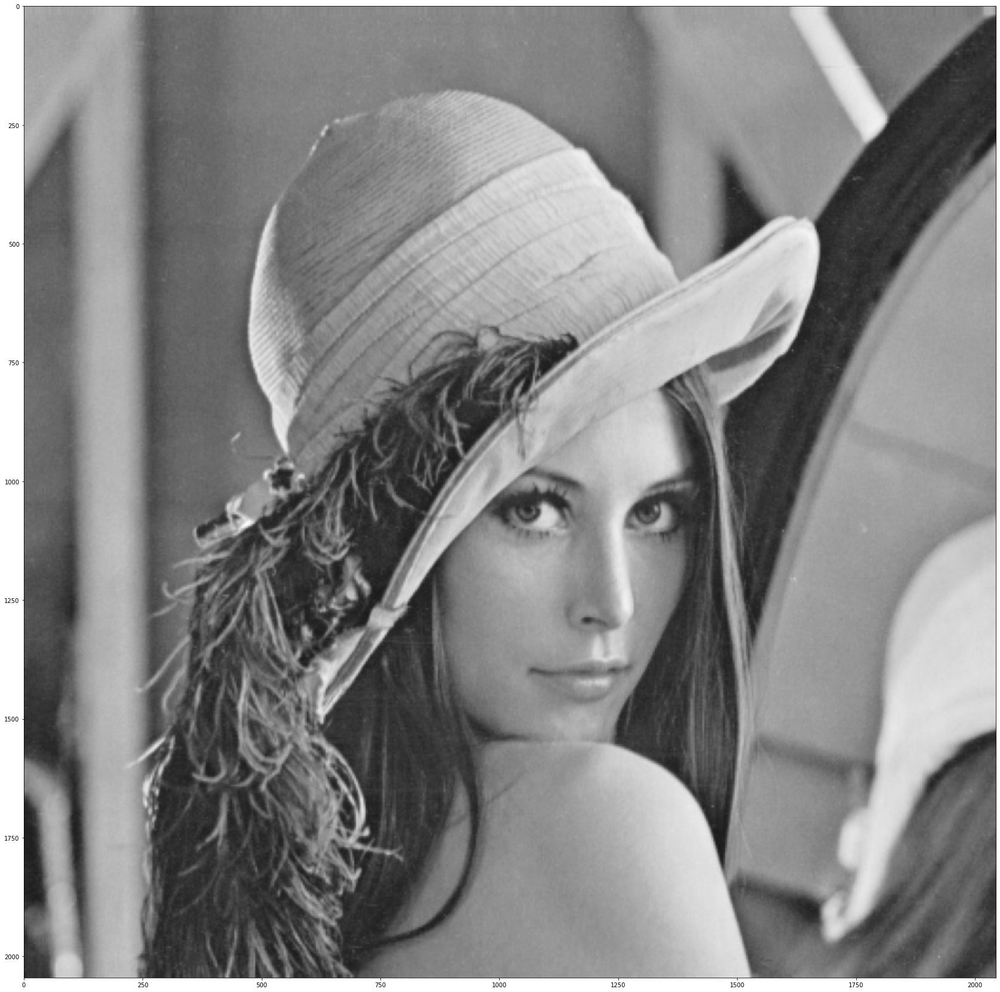

In [ ]:
i = PGMImage('images/lena.ascii.pgm')
i.up_sample(2)
i.display(30)